# Benchmark - Equivariant vs. Non-Equivariant Architectures

This notebook allows you to reproduce the comparisons between the different GNN architectures detailed in the paper + showcases that non-equivariant models still respect symmetries within the training data regime.

**Note**: It takes a considerable amount of time to run these tests

**Requirements**: Download Datasets + Pre-trained Models

In [1]:
import os
import jax
import sys
import glob
import yaml
import pickle
import numpy as np
import pandas as pd
import jax.numpy as jnp

# uncomment the line below for nicer plots (needs LaTeX)
# os.environ['MATPLOTLIBRC'] = '../matplotlibrc'
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as mpatches

sys.path.append('../..')

from pathlib import Path
from tqdm import tqdm

from gns.simulator import SMGNS
from gns.preprocess import init_GNS_as_SM
from gns.tests import rollout_error_crossings
from gns.utils import get_stats, abs_periodic_d
from sheet_model.utils import get_dx_eq, get_x_eq, get_max_dE

os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false" 
os.environ["XLA_PYTHON_CLIENT_ALLOCATOR"] = "platform"

## Training Curves

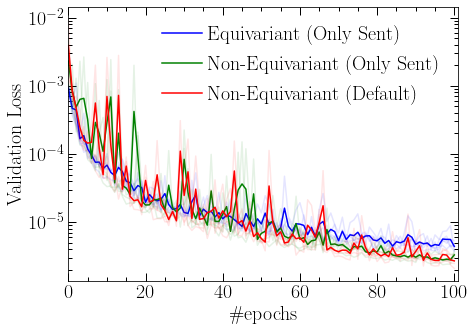

In [2]:
colors = {'equivariant': 'blue', 
          'nosent': 'green', 
          '': 'red'}

labels = {'equivariant': 'Equivariant (Only Sent)', 
          'nosent': 'Non-Equivariant (Only Sent)', 
          '': 'Non-Equivariant (Default)'}

plt.figure()

for k in ['equivariant', 'nosent', '']:
    aux = []
    for m in glob.glob(f'../../models/final/dt1e-1/{k}/[0-9]'):
        try:
            loss = pd.read_csv(Path(m) / 'loss.txt',delimiter=' ')
            aux.append(loss['valid'])
            plt.plot(loss['valid'], color=colors[k], alpha=0.1)
        except:
            pass
    plt.plot(np.mean(aux, axis=0), color=colors[k], label=labels[k])


plt.yscale('log')
plt.xlim(0, len(loss))
plt.xlabel(r'\#epochs')
plt.ylabel(r'Validation Loss')
plt.legend(loc='upper right')
plt.tight_layout()
plt.savefig('../img/benchmark_equivariant_loss.pdf')
plt.show()

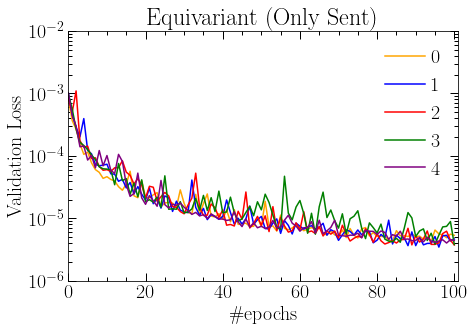

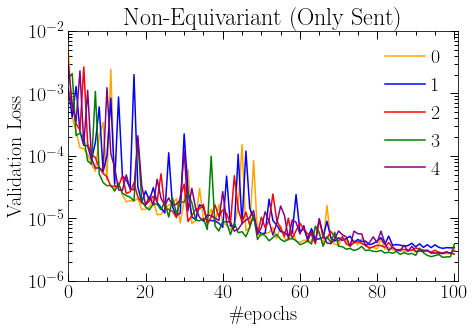

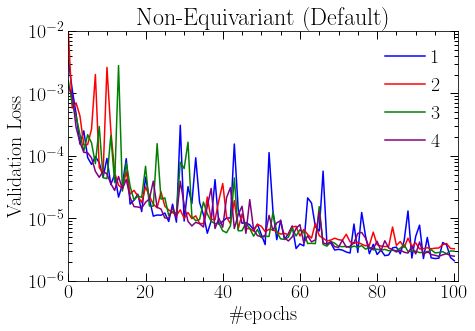

In [3]:
scolors = {'0': 'orange',
           '1': 'blue',
           '2': 'red',
           '3': 'green',
           '4': 'purple'}


for k in ['equivariant', 'nosent', '']:
    
    plt.figure()

    aux = []
    for m in sorted(glob.glob(f'../../models/final/dt1e-1/{k}/[0-9]')):
        try:
            seed = m.split('/')[-1]
            loss = pd.read_csv(Path(m) / 'loss.txt',delimiter=' ')
            plt.plot(loss['valid'], color=scolors[seed], label=seed)
        except:
            pass
    plt.title(labels[k])
    plt.yscale('log')
    plt.xlim(0, len(loss))
    plt.xlabel(r'\#epochs')
    plt.ylabel(r'Validation Loss')
    plt.legend(loc='upper right')
    plt.ylim(1e-6, 1e-2)
    plt.tight_layout()
    plt.savefig(f'../img/benchmark_equivariant_loss_{labels[k].lower()}.pdf')
    plt.show()

## Rollout Accuracy

In [4]:
rollout_acc = {'equivariant': dict(),
               'nosent': dict(),
               '': dict()}

N_SHEETS = [2, 10,100,1000]
boundary = 'periodic'

for k in rollout_acc:
    
    for model_folder in sorted(glob.glob(f'../../models/final/dt1e-1/{k}/[0-9]')):
        
        print(model_folder)
        
        sim = SMGNS(model_folder, boundary, verbose=False)

        seed = model_folder.split('/')[-1]
        rollout_acc[k][seed] = dict()

        for n_sheets in N_SHEETS:

            print(f'#Sheets: {n_sheets}')

            folder = f'../../data/dataset/test/{n_sheets}/{boundary}'
            X = jnp.array([jnp.load(f) for f in sorted(glob.glob(folder + '/x_[0-9]*.npy'))])
            V = jnp.array([jnp.load(f) for f in sorted(glob.glob(folder + '/v_*.npy'))])
            X_eq = jnp.array([jnp.load(f) for f in sorted(glob.glob(folder + '/x_eq*.npy'))])
            dx_eq = get_dx_eq(n_sheets)

            with open(Path(folder) / 'info.yml', 'rb') as f:
                info = yaml.safe_load(f)
                dt_simulator = info['dt']*info['dt_undersample']

            X = X[:,::int(sim.dt_train/dt_simulator)]
            V = V[:,::int(sim.dt_train/dt_simulator)]
            X_eq = X_eq[:,::int(sim.dt_train/dt_simulator)]

            e_x, e_w = rollout_error_crossings(X, V, X_eq, sim, n_guards=5)

            rollout_acc[k][seed][n_sheets] = {'e_x': get_stats(e_x/dx_eq),
                                              'e_w': get_stats(e_w/dx_eq)}

            del X, V, X_eq, dx_eq

            
with open('benchmark_equiv_rollout.pkl', 'wb') as f:
    pickle.dump(rollout_acc, f)

../../models/final/dt1e-1/equivariant/0
#Sheets: 2


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 10


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 100


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 1000


  0%|          | 0/100 [00:00<?, ?it/s]

../../models/final/dt1e-1/equivariant/1
#Sheets: 2


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 10


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 100


  0%|          | 0/100 [00:00<?, ?it/s]

2023-12-29 14:09:09.773515: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:65] Constant folding an instruction is taking > 1s:

  slice (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't necessarily a bug; constant-folding is inherently a trade-off between compilation time and speed at runtime.  XLA has some guards that attempt to keep constant folding from taking too long, but fundamentally you'll always be able to come up with an input program that takes a long time.

If you'd like to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
2023-12-29 14:09:09.773828: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:133] The operation took 1m39.727279981s
Constant folding an instruction is taking > 1s:

  slice (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't necess

#Sheets: 1000


  0%|          | 0/100 [00:00<?, ?it/s]

../../models/final/dt1e-1/equivariant/2
#Sheets: 2


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 10


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 100


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 1000


  0%|          | 0/100 [00:00<?, ?it/s]

2023-12-29 14:19:27.864540: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:65] Constant folding an instruction is taking > 2s:

  slice.1 (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't necessarily a bug; constant-folding is inherently a trade-off between compilation time and speed at runtime.  XLA has some guards that attempt to keep constant folding from taking too long, but fundamentally you'll always be able to come up with an input program that takes a long time.

If you'd like to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
2023-12-29 14:19:27.864808: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:133] The operation took 3m25.089676864s
Constant folding an instruction is taking > 2s:

  slice.1 (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't ne

../../models/final/dt1e-1/equivariant/3
#Sheets: 2


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 10


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 100


  0%|          | 0/100 [00:00<?, ?it/s]

2023-12-29 14:26:19.159041: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:65] Constant folding an instruction is taking > 4s:

  slice (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't necessarily a bug; constant-folding is inherently a trade-off between compilation time and speed at runtime.  XLA has some guards that attempt to keep constant folding from taking too long, but fundamentally you'll always be able to come up with an input program that takes a long time.

If you'd like to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
2023-12-29 14:26:19.159646: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:133] The operation took 1m40.267067409s
Constant folding an instruction is taking > 4s:

  slice (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't necess

#Sheets: 1000


  0%|          | 0/100 [00:00<?, ?it/s]

../../models/final/dt1e-1/equivariant/4
#Sheets: 2


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 10


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 100


  0%|          | 0/100 [00:00<?, ?it/s]

2023-12-29 14:34:56.226761: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:65] Constant folding an instruction is taking > 8s:

  slice.1 (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't necessarily a bug; constant-folding is inherently a trade-off between compilation time and speed at runtime.  XLA has some guards that attempt to keep constant folding from taking too long, but fundamentally you'll always be able to come up with an input program that takes a long time.

If you'd like to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
2023-12-29 14:34:56.227211: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:133] The operation took 1m40.662927306s
Constant folding an instruction is taking > 8s:

  slice.1 (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't ne

#Sheets: 1000


  0%|          | 0/100 [00:00<?, ?it/s]

../../models/final/dt1e-1/nosent/0
#Sheets: 2


  0%|          | 0/100 [00:00<?, ?it/s]

2023-12-29 14:40:08.022001: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:65] Constant folding an instruction is taking > 16s:

  slice (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't necessarily a bug; constant-folding is inherently a trade-off between compilation time and speed at runtime.  XLA has some guards that attempt to keep constant folding from taking too long, but fundamentally you'll always be able to come up with an input program that takes a long time.

If you'd like to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
2023-12-29 14:40:08.022457: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:133] The operation took 3m27.311898821s
Constant folding an instruction is taking > 16s:

  slice (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't nece

#Sheets: 10


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 100


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 1000


  0%|          | 0/100 [00:00<?, ?it/s]

2023-12-29 14:45:17.834355: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:133] The operation took 3m26.755360308s
Constant folding an instruction is taking > 32s:

  slice.4 (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't necessarily a bug; constant-folding is inherently a trade-off between compilation time and speed at runtime.  XLA has some guards that attempt to keep constant folding from taking too long, but fundamentally you'll always be able to come up with an input program that takes a long time.

If you'd like to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.


../../models/final/dt1e-1/nosent/1
#Sheets: 2


  0%|          | 0/100 [00:00<?, ?it/s]

2023-12-29 14:48:47.184079: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:65] Constant folding an instruction is taking > 32s:

  slice.3 (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't necessarily a bug; constant-folding is inherently a trade-off between compilation time and speed at runtime.  XLA has some guards that attempt to keep constant folding from taking too long, but fundamentally you'll always be able to come up with an input program that takes a long time.

If you'd like to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
2023-12-29 14:48:47.184418: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:133] The operation took 3m28.731879872s
Constant folding an instruction is taking > 32s:

  slice.3 (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't 

#Sheets: 10


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 100


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 1000


  0%|          | 0/100 [00:00<?, ?it/s]

../../models/final/dt1e-1/nosent/2
#Sheets: 2


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 10


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 100


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 1000


  0%|          | 0/100 [00:00<?, ?it/s]

2023-12-29 15:02:35.207710: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:65] Constant folding an instruction is taking > 1m4s:

  slice (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't necessarily a bug; constant-folding is inherently a trade-off between compilation time and speed at runtime.  XLA has some guards that attempt to keep constant folding from taking too long, but fundamentally you'll always be able to come up with an input program that takes a long time.

If you'd like to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
2023-12-29 15:02:35.207930: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:133] The operation took 1m43.687756878s
Constant folding an instruction is taking > 1m4s:

  slice (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't ne

../../models/final/dt1e-1/nosent/3
#Sheets: 2


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 10


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 100


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 1000


  0%|          | 0/100 [00:00<?, ?it/s]

../../models/final/dt1e-1/nosent/4
#Sheets: 2


  0%|          | 0/100 [00:00<?, ?it/s]

2023-12-29 15:14:46.002172: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:65] Constant folding an instruction is taking > 2m8s:

  slice (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't necessarily a bug; constant-folding is inherently a trade-off between compilation time and speed at runtime.  XLA has some guards that attempt to keep constant folding from taking too long, but fundamentally you'll always be able to come up with an input program that takes a long time.

If you'd like to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
2023-12-29 15:14:46.002793: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:133] The operation took 3m29.635677926s
Constant folding an instruction is taking > 2m8s:

  slice (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't ne

#Sheets: 10


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 100


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 1000


  0%|          | 0/100 [00:00<?, ?it/s]

../../models/final/dt1e-1/0
#Sheets: 2


  0%|          | 0/100 [00:00<?, ?it/s]

2023-12-29 15:23:25.435683: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:65] 
********************************
[Compiling module jit_pred] Very slow compile?  If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
********************************
2023-12-29 15:23:25.674804: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:133] The operation took 3m28.693771744s

********************************
[Compiling module jit_pred] Very slow compile?  If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
********************************


#Sheets: 10


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 100


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 1000


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 10


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 100


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 1000


  0%|          | 0/100 [00:00<?, ?it/s]

../../models/final/dt1e-1/2
#Sheets: 2


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 10


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 100


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 1000


  0%|          | 0/100 [00:00<?, ?it/s]

../../models/final/dt1e-1/3
#Sheets: 2


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 10


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 100


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 1000


  0%|          | 0/100 [00:00<?, ?it/s]

../../models/final/dt1e-1/4
#Sheets: 2


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 10


  0%|          | 0/100 [00:00<?, ?it/s]

#Sheets: 100


  0%|          | 0/100 [00:00<?, ?it/s]

2023-12-29 16:01:41.728139: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:65] Constant folding an instruction is taking > 4m16s:

  slice (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't necessarily a bug; constant-folding is inherently a trade-off between compilation time and speed at runtime.  XLA has some guards that attempt to keep constant folding from taking too long, but fundamentally you'll always be able to come up with an input program that takes a long time.

If you'd like to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
2023-12-29 16:01:41.728553: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:133] The operation took 8m41.808249444s
Constant folding an instruction is taking > 4m16s:

  slice (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't 

#Sheets: 1000


  0%|          | 0/100 [00:00<?, ?it/s]

In [5]:
## just for loading
N_SHEETS = [2, 10,100,1000]

with open('benchmark_equiv_rollout.pkl', 'rb') as f:
    rollout_acc = pickle.load(f)

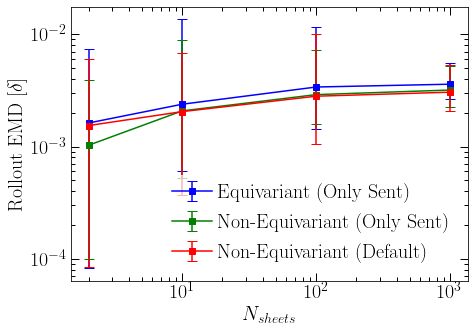

In [6]:
plt.figure()

for k, rk in rollout_acc.items():
    
    e_mean, e_min, e_max = [], [], []
    
    for seed, rseed in rk.items():
        e_mean.append(np.array([rseed[n]['e_w']['mean'] for n in N_SHEETS]))
        e_min.append(np.array([rseed[n]['e_w']['min'] for n in N_SHEETS]))
        e_max.append(np.array([rseed[n]['e_w']['max'] for n in N_SHEETS]))
    
    e_mean = np.mean(e_mean, axis=0)
    e_min = np.min(e_min, axis=0)
    e_max = np.max(e_max, axis=0)
        
    plt.errorbar(N_SHEETS, 
                 e_mean,
                 yerr=[e_mean - e_min, e_max - e_mean],
                 capsize=5, color=colors[k], marker='s', label=labels[k])


plt.yscale('log')
plt.xscale('log')
plt.xlabel('$N_{sheets}$')
plt.ylabel('Rollout EMD [$\delta$]')
plt.legend()
plt.tight_layout()
plt.savefig('../img/benchmark_equivariant_rollout.pdf')
plt.show()

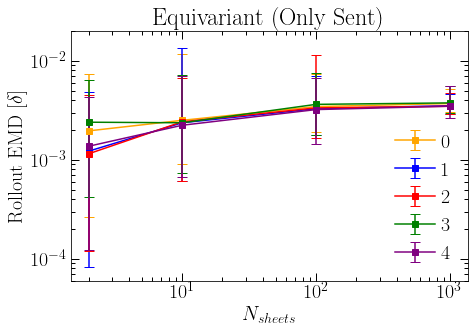

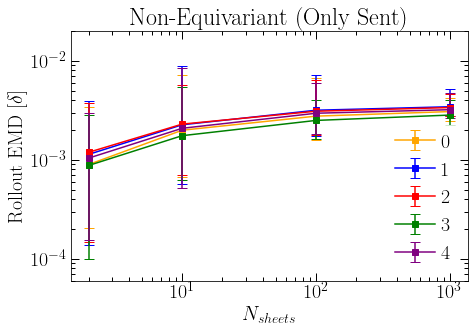

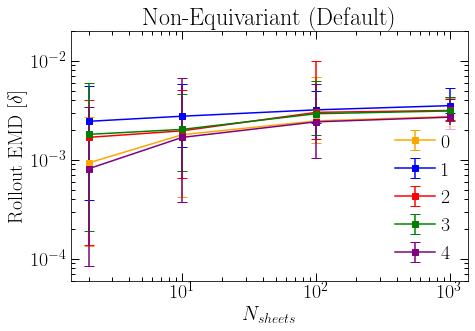

In [7]:
for k, rk in rollout_acc.items():
    
    plt.figure()
    
    for seed in sorted(rk):
        e_mean = np.array([rk[seed][n]['e_w']['mean'] for n in N_SHEETS])
        e_min = np.array([rk[seed][n]['e_w']['min'] for n in N_SHEETS])
        e_max = np.array([rk[seed][n]['e_w']['max'] for n in N_SHEETS])
    
        plt.errorbar(N_SHEETS, 
                     e_mean,
                     yerr=[e_mean - e_min, e_max - e_mean],
                     capsize=5, marker='s', color=scolors[seed], label=seed)

    plt.title(labels[k])
    plt.yscale('log')
    plt.xscale('log')
    plt.xlabel('$N_{sheets}$')
    plt.ylabel('Rollout EMD [$\delta$]')
    plt.ylim(6e-5, 2e-2)
    plt.legend()
    plt.tight_layout()
    plt.savefig(f'../img/benchmark_equivariant_rollout_{labels[k].lower()}.pdf')
    plt.show()

## Energy Conservation

In [8]:
opt = {
    'n_sheets': 1000,
    'n_guards': 20,
    'tmax': 2*np.pi*10,
    'boundary' : 'periodic',
    'L': 1
}

V_TH = np.logspace(0,2,10)

### Thermal Plasma

In [9]:
dx_eq = get_dx_eq(opt['n_sheets'])
x_eq = get_x_eq(opt['n_sheets'])

energy_cons = {'equivariant': dict(),
               'nosent': dict(),
               '': dict()}

for k in energy_cons:
    
    for model_folder in glob.glob(f'../../models/final/dt1e-1/{k}/[0-9]'):
        
        print(model_folder)
        
        gns = SMGNS(model_folder, opt['boundary'], verbose=False)
        seed = model_folder.split('/')[-1]
        
        energy_cons[k][seed] = []
        
        for v_th in V_TH:

            print(f'v_th: {v_th:.1f}')
            np.random.seed(42)
            x0 = x_eq.copy()
            v0 = np.random.normal(0, v_th, opt['n_sheets']) * dx_eq
            
            x0, v0, x_eq0, E0 = init_GNS_as_SM(x0,
                                               v0,
                                               x_eq,
                                               gns=gns
                                               n_guards=opt['n_guards'])

            _, _, _, E = gns.pred_rollout(x0, 
                                          v0,
                                          x_eq,
                                          t_max=opt['tmax'],
                                          n_guards=0,
                                          verbose=False,
                                          track_sheets=False,
                                          np_=np)

            dE = get_max_dE(E, 
                            dt=gns.dt_train, 
                            E0=E0,
                            w_ma=2*np.pi,
                            t_skip=2*np.pi)
            
            energy_cons[k][seed].append(dE)

with open('benchmark_equiv_energy.pkl', 'wb') as f:
    pickle.dump(energy_cons, f)

../../models/final/dt1e-1/equivariant/4
v_th: 1.0
v_th: 1.7
v_th: 2.8
v_th: 4.6
v_th: 7.7
v_th: 12.9
v_th: 21.5
v_th: 35.9
v_th: 59.9
v_th: 100.0
../../models/final/dt1e-1/equivariant/2
v_th: 1.0
v_th: 1.7
v_th: 2.8
v_th: 4.6
v_th: 7.7
v_th: 12.9
v_th: 21.5
v_th: 35.9
v_th: 59.9
v_th: 100.0
../../models/final/dt1e-1/equivariant/0
v_th: 1.0
v_th: 1.7
v_th: 2.8
v_th: 4.6
v_th: 7.7
v_th: 12.9
v_th: 21.5
v_th: 35.9
v_th: 59.9
v_th: 100.0
../../models/final/dt1e-1/equivariant/1
v_th: 1.0
v_th: 1.7
v_th: 2.8
v_th: 4.6
v_th: 7.7
v_th: 12.9
v_th: 21.5
v_th: 35.9
v_th: 59.9
v_th: 100.0
../../models/final/dt1e-1/equivariant/3
v_th: 1.0
v_th: 1.7
v_th: 2.8
v_th: 4.6
v_th: 7.7
v_th: 12.9
v_th: 21.5
v_th: 35.9
v_th: 59.9
v_th: 100.0
../../models/final/dt1e-1/nosent/4
v_th: 1.0
v_th: 1.7
v_th: 2.8
v_th: 4.6
v_th: 7.7
v_th: 12.9
v_th: 21.5
v_th: 35.9
v_th: 59.9
v_th: 100.0
../../models/final/dt1e-1/nosent/2
v_th: 1.0
v_th: 1.7
v_th: 2.8
v_th: 4.6
v_th: 7.7
v_th: 12.9
v_th: 21.5
v_th: 35.9
v_th: 59.9


In [10]:
with open('benchmark_equiv_energy.pkl', 'rb') as f:
    energy_cons = pickle.load(f)

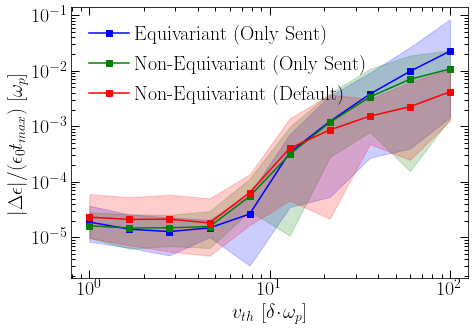

In [11]:
plt.figure()

for k, ek in energy_cons.items():
    aux = []
    for _, e in ek.items():
        aux.append(e)    
    aux = np.array(aux)/opt['tmax']
    
    plt.fill_between(V_TH, np.min(aux, axis=0), np.max(aux, axis=0),
                     color=colors[k], alpha=.2)

    plt.plot(V_TH, np.mean(aux, axis=0), color=colors[k], marker='s', label=labels[k])


plt.legend(framealpha=0)
plt.xlabel('$v_{th}$ [$\delta\!\cdot\!\omega_p$]')
plt.ylabel('$|\Delta\epsilon|/(\epsilon_0 t_{max}$) [$\omega_p$]')
plt.yscale('log')
plt.xscale('log')
plt.tight_layout()
plt.savefig('../img/benchmark_equivariant_energy.pdf')
plt.show()

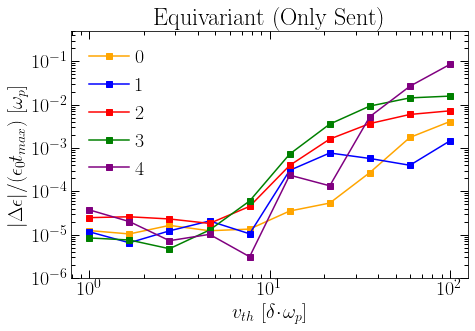

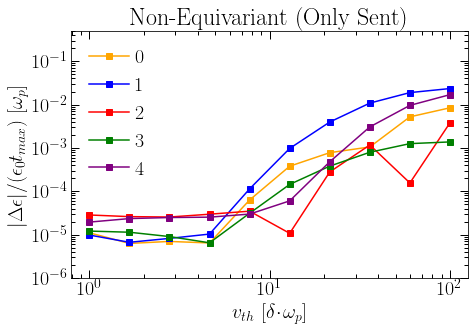

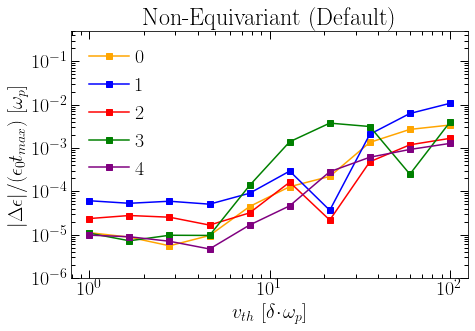

In [12]:
for k, ek in energy_cons.items():
    
    plt.figure()
    
    for seed in sorted(ek):
        plt.plot(V_TH, np.array(ek[seed])/opt['tmax'], color=scolors[seed], marker='s', label=seed)

    plt.title(labels[k])
    plt.legend(framealpha=0)
    plt.xlabel('$v_{th}$ [$\delta\!\cdot\!\omega_p$]')
    plt.ylabel('$|\Delta\epsilon|/(\epsilon_0 t_{max}$) [$\omega_p$]')
    plt.yscale('log')
    plt.xscale('log')
    plt.ylim(1e-6, 5e-1)
    plt.tight_layout()
    plt.savefig(f'../img/benchmark_equivariant_energy_{labels[k].lower()}.pdf')
    plt.show()

### Oscillatory Motion

In [13]:
V_TH = np.logspace(0,2,10)

energy_cons_osc = {'equivariant': dict(),
                   'nosent': dict(),
                   '': dict()}

for k in energy_cons_osc:
    
    for model_folder in glob.glob(f'../../models/final/dt1e-1/{k}/[0-9]'):
        
        print(model_folder)
        
        gns = SMGNS(model_folder, opt['boundary'], verbose=False)
        seed = model_folder.split('/')[-1]
        
        energy_cons_osc[k][seed] = []
        
        for v_th in V_TH:

            print(f'v_th: {v_th:.1f}')
        
            np.random.seed(42)
            x0 = x_eq.copy()
            v0 = np.ones_like(x0) * v_th * dx_eq
            
            x0, v0, x_eq0, E0 = init_GNS_as_SM(x0,
                                               v0,
                                               x_eq,
                                               gns=gns,
                                               n_guards=opt['n_guards'])

            _, _, _, E = gns.pred_rollout(x0, 
                                          v0,
                                          x_eq,
                                          t_max=opt['tmax'],
                                          n_guards=0,
                                          verbose=False,
                                          track_sheets=False,
                                          np_=np)

            dE = get_max_dE(E, 
                            dt=gns.dt_train, 
                            E0=E0,
                            w_ma=2*np.pi,
                            t_skip=2*np.pi)
            

            energy_cons_osc[k][seed].append(dE)
            
with open('benchmark_equiv_energy_osc.pkl', 'wb') as f:
    pickle.dump(energy_cons_osc, f)

../../models/final/dt1e-1/equivariant/4
v_th: 1.0
v_th: 1.7
v_th: 2.8
v_th: 4.6
v_th: 7.7
v_th: 12.9
v_th: 21.5
v_th: 35.9
v_th: 59.9
v_th: 100.0
../../models/final/dt1e-1/equivariant/2
v_th: 1.0
v_th: 1.7
v_th: 2.8
v_th: 4.6
v_th: 7.7
v_th: 12.9
v_th: 21.5
v_th: 35.9
v_th: 59.9
v_th: 100.0
../../models/final/dt1e-1/equivariant/0
v_th: 1.0
v_th: 1.7
v_th: 2.8
v_th: 4.6
v_th: 7.7
v_th: 12.9
v_th: 21.5
v_th: 35.9
v_th: 59.9
v_th: 100.0
../../models/final/dt1e-1/equivariant/1
v_th: 1.0
v_th: 1.7
v_th: 2.8
v_th: 4.6
v_th: 7.7
v_th: 12.9
v_th: 21.5
v_th: 35.9
v_th: 59.9
v_th: 100.0
../../models/final/dt1e-1/equivariant/3
v_th: 1.0
v_th: 1.7
v_th: 2.8
v_th: 4.6
v_th: 7.7
v_th: 12.9
v_th: 21.5
v_th: 35.9
v_th: 59.9
v_th: 100.0
../../models/final/dt1e-1/nosent/4
v_th: 1.0
v_th: 1.7
v_th: 2.8
v_th: 4.6
v_th: 7.7
v_th: 12.9
v_th: 21.5
v_th: 35.9
v_th: 59.9
v_th: 100.0
../../models/final/dt1e-1/nosent/2
v_th: 1.0
v_th: 1.7
v_th: 2.8
v_th: 4.6
v_th: 7.7
v_th: 12.9
v_th: 21.5
v_th: 35.9
v_th: 59.9


In [14]:
with open('benchmark_equiv_energy_osc.pkl', 'rb') as f:
    energy_cons_osc = pickle.load(f)

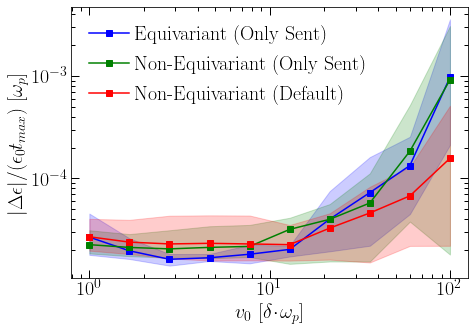

In [15]:
plt.figure()

for k, ek in energy_cons_osc.items():
    aux = []
    for _, e in ek.items():
        aux.append(e)    
    aux = np.array(aux)/opt['tmax']
    
    plt.fill_between(V_TH, np.min(aux, axis=0), np.max(aux, axis=0),
                     color=colors[k], alpha=.2)

    plt.plot(V_TH, np.mean(aux, axis=0), color=colors[k], marker='s', label=labels[k])


plt.legend(framealpha=0)
plt.xlabel('$v_0$ [$\delta\!\cdot\!\omega_p$]')
plt.ylabel('$|\Delta\epsilon|/(\epsilon_0 t_{max}$) [$\omega_p$]')
plt.yscale('log')
plt.xscale('log')
plt.tight_layout()
plt.savefig('../img/benchmark_equivariant_energy_osc.pdf')
plt.show()

### Cold Beams

In [16]:
energy_cons_beams = {'equivariant': dict(),
                     'nosent': dict(),
                     '': dict()}

for k in energy_cons_beams:
    
    for model_folder in glob.glob(f'../../models/final/dt1e-1/{k}/[0-9]'):
        
        print(model_folder)
        
        gns = SMGNS(model_folder, opt['boundary'], verbose=False)
        seed = model_folder.split('/')[-1]
        
        energy_cons_beams[k][seed] = []
        
        for v_th in V_TH:

            print(f'v_th: {v_th:.1f}')
            
            np.random.seed(42)
            
            x0 = x_eq.copy()
            v0 = np.random.choice([-1,1], n_sheets) * v_th * dx_eq
            
            x0, v0, x_eq0, E0 = init_GNS_as_SM(x0,
                                               v0,
                                               x_eq,
                                               gns=gns,
                                               n_guards=opt['n_guards'])

            _, _, _, E = gns.pred_rollout(x0, 
                                          v0,
                                          x_eq,
                                          t_max=opt['tmax'],
                                          n_guards=0,
                                          verbose=False,
                                          track_sheets=False,
                                          np_=np)

            dE = get_max_dE(E, 
                            dt=gns.dt_train, 
                            E0=E0,
                            w_ma=2*np.pi,
                            t_skip=2*np.pi)
            
            energy_cons_beams[k][seed].append(dE)
            
with open('benchmark_equiv_energy_beams.pkl', 'wb') as f:
    pickle.dump(energy_cons_beams, f)

../../models/final/dt1e-1/equivariant/4
v_th: 1.0
v_th: 1.7
v_th: 2.8
v_th: 4.6
v_th: 7.7
v_th: 12.9
v_th: 21.5
v_th: 35.9
v_th: 59.9
v_th: 100.0
../../models/final/dt1e-1/equivariant/2
v_th: 1.0
v_th: 1.7
v_th: 2.8
v_th: 4.6
v_th: 7.7
v_th: 12.9
v_th: 21.5
v_th: 35.9
v_th: 59.9
v_th: 100.0
../../models/final/dt1e-1/equivariant/0
v_th: 1.0
v_th: 1.7
v_th: 2.8
v_th: 4.6
v_th: 7.7
v_th: 12.9
v_th: 21.5
v_th: 35.9
v_th: 59.9
v_th: 100.0
../../models/final/dt1e-1/equivariant/1
v_th: 1.0
v_th: 1.7
v_th: 2.8
v_th: 4.6
v_th: 7.7
v_th: 12.9
v_th: 21.5
v_th: 35.9
v_th: 59.9
v_th: 100.0
../../models/final/dt1e-1/equivariant/3
v_th: 1.0
v_th: 1.7
v_th: 2.8
v_th: 4.6
v_th: 7.7
v_th: 12.9
v_th: 21.5
v_th: 35.9
v_th: 59.9
v_th: 100.0
../../models/final/dt1e-1/nosent/4
v_th: 1.0
v_th: 1.7
v_th: 2.8
v_th: 4.6
v_th: 7.7
v_th: 12.9
v_th: 21.5
v_th: 35.9
v_th: 59.9
v_th: 100.0
../../models/final/dt1e-1/nosent/2
v_th: 1.0
v_th: 1.7
v_th: 2.8
v_th: 4.6
v_th: 7.7
v_th: 12.9
v_th: 21.5
v_th: 35.9
v_th: 59.9


In [17]:
with open('benchmark_equiv_energy_beams.pkl', 'rb') as f:
    energy_cons_beams = pickle.load(f)

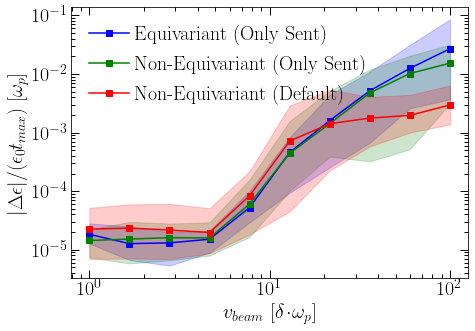

In [18]:
plt.figure()

for k, ek in energy_cons_beams.items():
    aux = []
    for _, e in ek.items():
        aux.append(e)    
    aux = np.array(aux)/opt['tmax']
    
    plt.fill_between(V_TH, np.min(aux, axis=0), np.max(aux, axis=0),
                     color=colors[k], alpha=.2)

    plt.plot(V_TH, np.mean(aux, axis=0), color=colors[k], marker='s', label=labels[k])


plt.legend(framealpha=0)
plt.xlabel('$v_{beam}$ [$\delta\!\cdot\!\omega_p$]')
plt.ylabel('$|\Delta\epsilon|/(\epsilon_0 t_{max}$) [$\omega_p$]')
plt.yscale('log')
plt.xscale('log')
plt.tight_layout()
plt.savefig('../img/benchmark_equivariant_energy_beams.pdf')
plt.show()

### Joint Plots

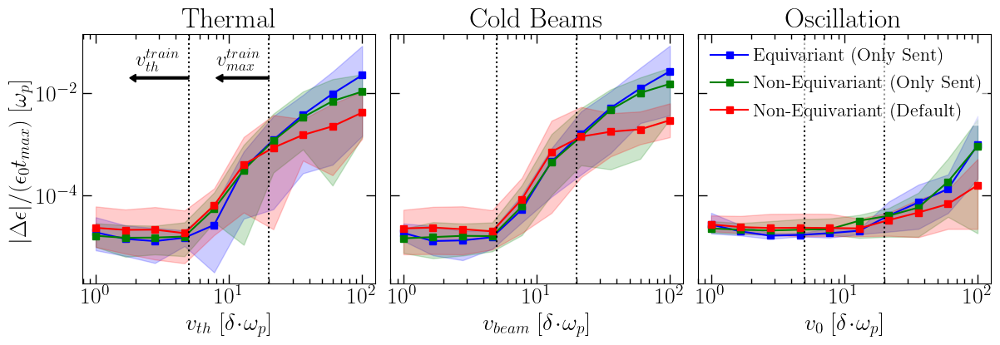

In [19]:
fig, ax = plt.subplots(1,3, figsize=(12,4), sharex=True, sharey=True, 
                       gridspec_kw={'wspace': 0.05, 'bottom': 0.17, 'top': 0.92, 'left': 0.08, 'right': 0.99})

for k, ek in energy_cons.items():
    aux = []
    for _, e in ek.items():
        aux.append(e)    
    aux = np.array(aux)/opt['tmax']
    
    ax[0].fill_between(V_TH, np.min(aux, axis=0), np.max(aux, axis=0),
                     color=colors[k], alpha=.2)

    ax[0].plot(V_TH, np.mean(aux, axis=0), color=colors[k], marker='s', label=labels[k])


for k, ek in energy_cons_beams.items():
    aux = []
    for _, e in ek.items():
        aux.append(e)    
    aux = np.array(aux)/opt['tmax']
    
    ax[1].fill_between(V_TH, np.min(aux, axis=0), np.max(aux, axis=0),
                     color=colors[k], alpha=.2)

    ax[1].plot(V_TH, np.mean(aux, axis=0), color=colors[k], marker='s', label=labels[k])


    
for k, ek in energy_cons_osc.items():
    aux = []
    for _, e in ek.items():
        aux.append(e)    
    aux = np.array(aux)/opt['tmax']
    
    ax[2].fill_between(V_TH, np.min(aux, axis=0), np.max(aux, axis=0),
                     color=colors[k], alpha=.2)

    ax[2].plot(V_TH, np.mean(aux, axis=0), color=colors[k], marker='s', label=labels[k])


for a in ax:
    a.axvline(20, ls=':', color='k')
    a.axvline(5, ls=':', color='k')

ax[0].arrow(20, 2*10**-2., -11, 0, width=0.2*10**-2, head_width=7*10**-3, head_length=1, color='k')
ax[0].arrow(5, 2*10**-2., -3, 0, width=0.2*10**-2, head_width=7*10**-3, head_length=0.2, color='k')
ax[0].text(8, 3.5*10**-2, '$v_{max}^{train}$', fontsize=18)
ax[0].text(2, 3.5*10**-2, '$v_{th}^{train}$', fontsize=18)


ax[0].set_title('Thermal')
ax[1].set_title('Cold Beams')
ax[2].set_title('Oscillation')

ax[0].set_xlabel('$v_{th}$ [$\delta\!\cdot\!\omega_p$]')
ax[1].set_xlabel('$v_{beam}$ [$\delta\!\cdot\!\omega_p$]')
ax[2].set_xlabel('$v_{0}$ [$\delta\!\cdot\!\omega_p$]')

ax[0].set_ylabel('$|\Delta\epsilon|/(\epsilon_0 t_{max}$) [$\omega_p$]')

plt.legend(framealpha=0.6, loc='upper left', fontsize=16, borderpad=0.2)
plt.yscale('log')
plt.xscale('log')
plt.savefig('../img/benchmark_equivariant_energy_all.pdf')
plt.show()

## \#Training Simulations

In [21]:
results_nsim = dict()
boundary = 'periodic'
n_sheets = 10
N_SIM = [1,10,100,1000,9900]

folder = f'../../data/dataset/test/{n_sheets}/{boundary}'
X = jnp.array([jnp.load(f) for f in sorted(glob.glob(folder + '/x_[0-9]*.npy'))])
V = jnp.array([jnp.load(f) for f in sorted(glob.glob(folder + '/v_*.npy'))])
X_eq = jnp.array([jnp.load(f) for f in sorted(glob.glob(folder + '/x_eq*.npy'))])
dx_eq = get_dx_eq(n_sheets)


for mode in ['equivariant', 'notequivariant']:
    results_nsim[mode] = dict()
    
    for augmentation in ['no_augment', 'both']:
        
        print(mode, augmentation)

        results_nsim[mode][augmentation] = dict()

        for n_sim in N_SIM:

            print(f'n_sim: {n_sim}')
            
            model_folder = f'../../models/experiments/n_sim/{mode}/{augmentation}/dt1e-1/{n_sim}'
            model_folder = Path(model_folder)
            print(model_folder)
            sim = SMGNS(model_folder, boundary, verbose=False)

            with open(Path(folder) / 'info.yml', 'rb') as f:
                info = yaml.safe_load(f)
                dt_simulator = info['dt']*info['dt_undersample']

            _, e_w = rollout_error_crossings(X[:,::int(sim.dt_train/dt_simulator)], 
                                             V[:,::int(sim.dt_train/dt_simulator)],
                                             X_eq[:,::int(sim.dt_train/dt_simulator)], 
                                             sim)

            results_nsim[mode][augmentation][n_sim] = get_stats(e_w/dx_eq)

                
with open('benchmark_equiv_nsim.pkl', 'wb') as f:
    pickle.dump(results_nsim, f)

equivariant no_augment
n_sim: 1
../../models/experiments/n_sim/equivariant/no_augment/dt1e-1/1


  0%|          | 0/100 [00:00<?, ?it/s]

2023-12-29 16:58:43.725933: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:65] Constant folding an instruction is taking > 8m32s:

  slice.1 (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This isn't necessarily a bug; constant-folding is inherently a trade-off between compilation time and speed at runtime.  XLA has some guards that attempt to keep constant folding from taking too long, but fundamentally you'll always be able to come up with an input program that takes a long time.

If you'd like to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
2023-12-29 16:58:43.726121: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:133] The operation took 43m29.282121193s
Constant folding an instruction is taking > 8m32s:

  slice.1 (displaying the full instruction incurs a runtime overhead. Raise your logging level to 4 or above).

This i

n_sim: 10
../../models/experiments/n_sim/equivariant/no_augment/dt1e-1/10


  0%|          | 0/100 [00:00<?, ?it/s]

n_sim: 100
../../models/experiments/n_sim/equivariant/no_augment/dt1e-1/100


  0%|          | 0/100 [00:00<?, ?it/s]

n_sim: 1000
../../models/experiments/n_sim/equivariant/no_augment/dt1e-1/1000


  0%|          | 0/100 [00:00<?, ?it/s]

n_sim: 9900
../../models/experiments/n_sim/equivariant/no_augment/dt1e-1/9900


  0%|          | 0/100 [00:00<?, ?it/s]

equivariant both
n_sim: 1
../../models/experiments/n_sim/equivariant/both/dt1e-1/1


  0%|          | 0/100 [00:00<?, ?it/s]

n_sim: 10
../../models/experiments/n_sim/equivariant/both/dt1e-1/10


  0%|          | 0/100 [00:00<?, ?it/s]

2023-12-29 17:11:30.166351: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:133] The operation took 2m30.06672582s

********************************
[Compiling module jit_pred] Very slow compile?  If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
********************************


n_sim: 1000
../../models/experiments/n_sim/equivariant/both/dt1e-1/1000


  0%|          | 0/100 [00:00<?, ?it/s]

n_sim: 9900
../../models/experiments/n_sim/equivariant/both/dt1e-1/9900


  0%|          | 0/100 [00:00<?, ?it/s]

2023-12-29 17:18:31.265153: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:133] The operation took 2m9.073785786s

********************************
[Compiling module jit__label_sort] Very slow compile?  If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
********************************


notequivariant no_augment
n_sim: 1
../../models/experiments/n_sim/notequivariant/no_augment/dt1e-1/1


  0%|          | 0/100 [00:00<?, ?it/s]

n_sim: 10
../../models/experiments/n_sim/notequivariant/no_augment/dt1e-1/10


  0%|          | 0/100 [00:00<?, ?it/s]

n_sim: 100
../../models/experiments/n_sim/notequivariant/no_augment/dt1e-1/100


  0%|          | 0/100 [00:00<?, ?it/s]

n_sim: 1000
../../models/experiments/n_sim/notequivariant/no_augment/dt1e-1/1000


  0%|          | 0/100 [00:00<?, ?it/s]

n_sim: 9900
../../models/experiments/n_sim/notequivariant/no_augment/dt1e-1/9900


  0%|          | 0/100 [00:00<?, ?it/s]

notequivariant both
n_sim: 1
../../models/experiments/n_sim/notequivariant/both/dt1e-1/1


  0%|          | 0/100 [00:00<?, ?it/s]

n_sim: 10
../../models/experiments/n_sim/notequivariant/both/dt1e-1/10


  0%|          | 0/100 [00:00<?, ?it/s]

n_sim: 100
../../models/experiments/n_sim/notequivariant/both/dt1e-1/100


  0%|          | 0/100 [00:00<?, ?it/s]

n_sim: 1000
../../models/experiments/n_sim/notequivariant/both/dt1e-1/1000


  0%|          | 0/100 [00:00<?, ?it/s]

n_sim: 9900
../../models/experiments/n_sim/notequivariant/both/dt1e-1/9900


  0%|          | 0/100 [00:00<?, ?it/s]

In [22]:
N_SIM = [1,10,100,1000,9900]

with open('benchmark_equiv_nsim.pkl', 'rb') as f:
    results_nsim = pickle.load(f)

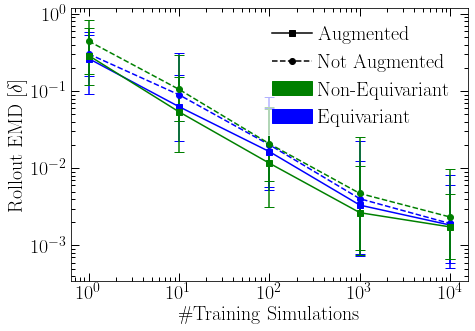

In [23]:
plt.figure()

colors_nsim = {'notequivariant': 'green', 'equivariant': 'blue'}

linestyle_nsim = {'both': '-', 'no_augment': '--'}

markers_nsim = {'both': 's', 
           'no_augment': 'o'}

labels_nsim = {'both': 'Augmented', 
          'no_augment': 'Not Augmented',
          'notequivariant': 'Non-Equivariant',
          'equivariant': 'Equivariant'}

for equiv, rm in results_nsim.items():
    for augmentation, ra in rm.items():
        
            n_sim = np.array(list(ra.keys()))
            e = np.array([ra[n]['mean'] for n in n_sim]) 
            e_min = np.array([ra[n]['min'] for n in n_sim]) 
            e_max = np.array([ra[n]['max'] for n in n_sim])

            plt.errorbar(n_sim, 
                         e,
                         yerr=[e - e_min, e_max - e],
                         capsize=5, ls=linestyle_nsim[augmentation], color=colors_nsim[equiv],
                         marker=markers_nsim[augmentation],
                         )


handles = []
for k in markers_nsim:
    handles.append(mlines.Line2D([], [], color='k', linestyle=linestyle_nsim[k], marker=markers_nsim[k], label=labels_nsim[k]))
for equiv, c in colors_nsim.items():
    handles.append(mpatches.Patch(color=c, label=labels_nsim[equiv]))

plt.legend(handles=handles, loc='upper right')

plt.xscale('log')
plt.yscale('log')
plt.ylabel('Rollout EMD [$\delta$]')
plt.xlabel('\#Training Simulations')
plt.tight_layout()
plt.savefig('../img/benchmark_equiv_nsimulations')
plt.show()

## Are architectures respecting reflection symmetry?

Showcases examples with two similations with mirrored initial conditions.

We expect that sheet positions + velocities match if we mirror the predicted rollouts (i.e. blue curves always on top of the red curves).

### Ex. 1 - Oscillating Sheets (No crossings)

The non-equivariant models do not showcase significant differences for a small sheet velocity. However if we increase the value significantly, this difference becomes noticeable.

The equivariant model (as expected) showcases the expected symmetry. However, as numerical erros start accumulating, the two simulations start to differ.

#### Low $v$

  0%|          | 0/628 [00:00<?, ?it/s]

  0%|          | 0/628 [00:00<?, ?it/s]

2023-12-29 17:44:47.693003: E external/org_tensorflow/tensorflow/compiler/xla/service/slow_operation_alarm.cc:133] The operation took 2m33.20880836s

********************************
[Compiling module jit__flip] Very slow compile?  If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
********************************


<Figure size 1500x500 with 0 Axes>

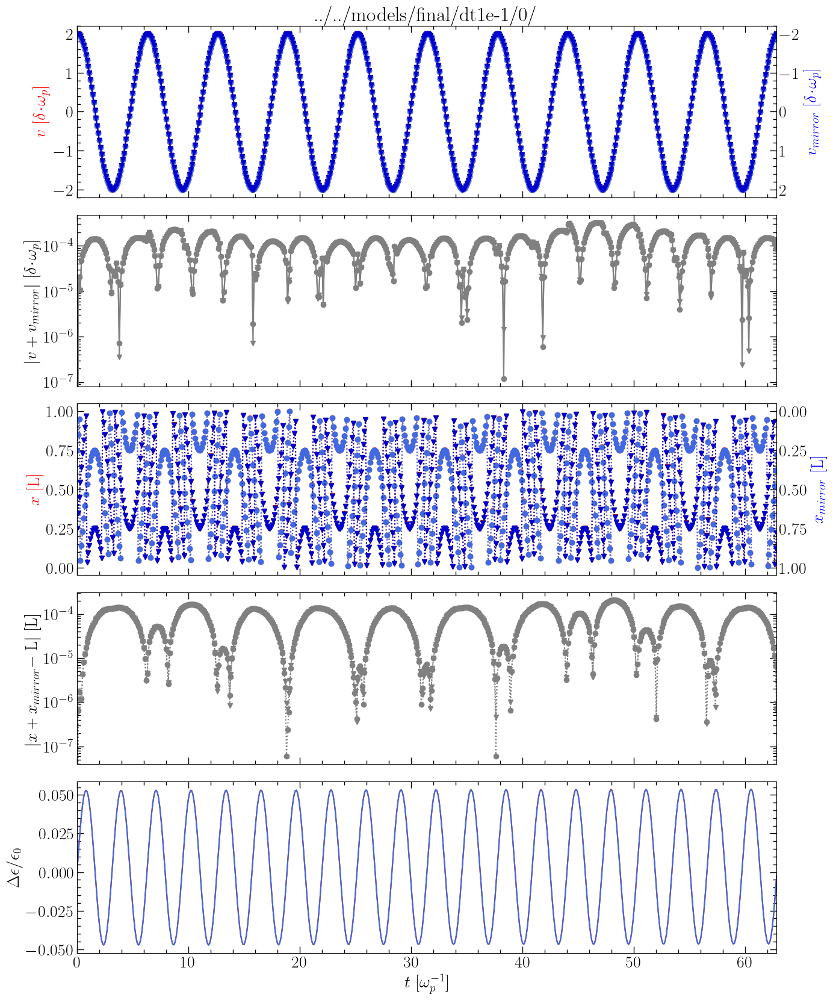

  0%|          | 0/628 [00:00<?, ?it/s]

  0%|          | 0/628 [00:00<?, ?it/s]

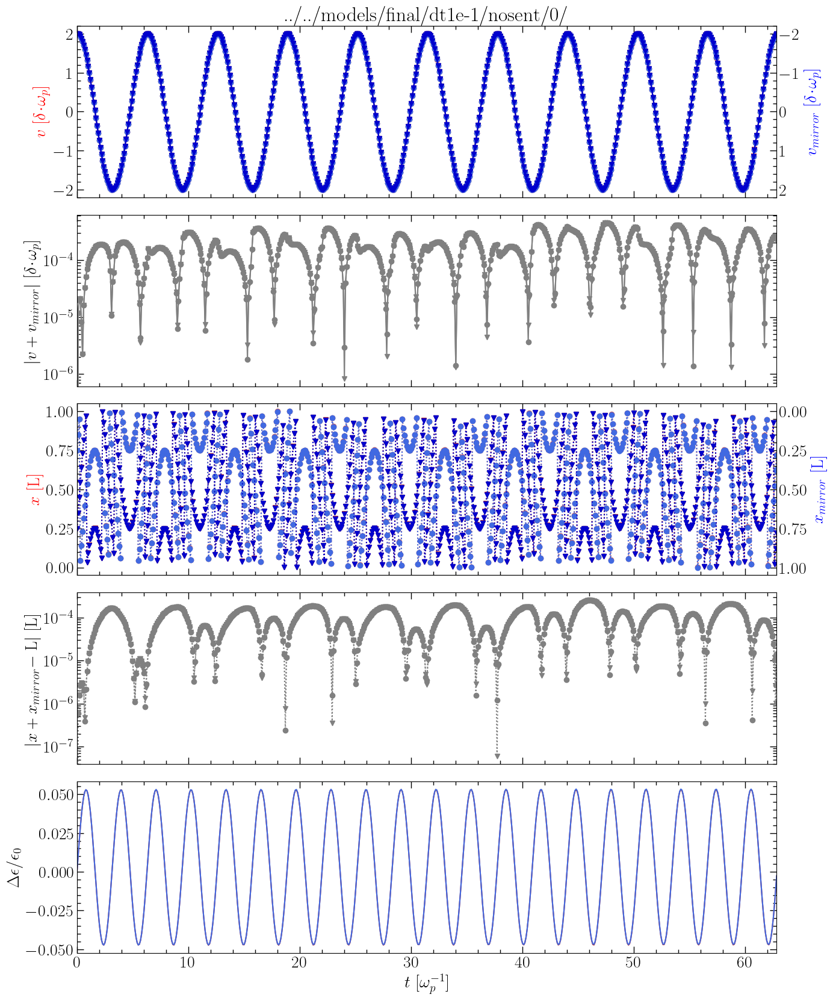

  0%|          | 0/628 [00:00<?, ?it/s]

  0%|          | 0/628 [00:00<?, ?it/s]

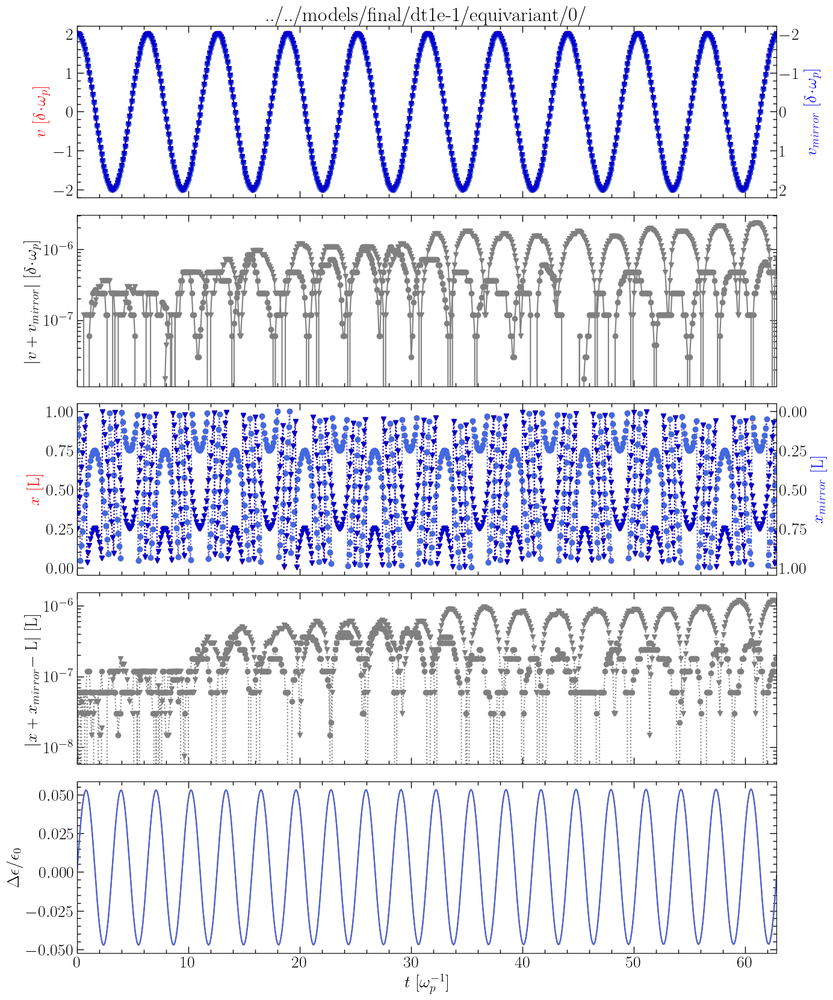

In [24]:
from gns.utils import abs_periodic_d

opt = {
    'n_sheets' : 2, # number of sheets
    'tmax' : 2*np.pi*10, # total simulation time [1/w_p]
    'boundary' : 'periodic', # boundary type (periodic or reflecting)
    'L': 1
}

dx_eq = get_dx_eq(opt['n_sheets']) 
x_eq = get_x_eq(opt['n_sheets'])

plt.figure(figsize=(15,5))

v_max = 2

for model in ['../../models/final/dt1e-1/0/', 
              '../../models/final/dt1e-1/nosent/0/',
              '../../models/final/dt1e-1/equivariant/0/']:
    
    fig, ax = plt.subplots(5,1,figsize=(15,20), sharex=True, gridspec_kw={'hspace': 0.1})
    ax_t = [a.twinx() if i in [0,2] else None for i, a in enumerate(ax)]
    
    A=[]
    
    gns = SMGNS(model, opt['boundary'], verbose=False)
    
    ######## simulation 1
    x_0 = x_eq.copy() 
    v_0 = np.zeros(opt['n_sheets'])
    
    # equivariance breaks up with multiple particles at x=x_eq and v=0 (because of numerical errors)
    v_0[:] = v_max * dx_eq
    x_0[:] = x_eq[:]
    
    X_1, V_1, X_eq1, E_1 = gns.pred_rollout(x_0,
                                        v_0,
                                        x_eq,
                                        t_max=opt['tmax'],
                                        verbose=True,
                                        n_guards=5 if opt['boundary']=='reflecting' else 0,
                                        np_=np)
     
    ######## simulation 2 (mirror of simulation 1)
    x_0 = np.flip(opt['L'] - x_0)
    v_0 = np.flip(-v_0)
    
    X_2, V_2, X_eq2, E_2 = gns.pred_rollout(x_0,
                                        v_0,
                                        x_eq,
                                        t_max=opt['tmax'],
                                        verbose=True,
                                        n_guards=5 if opt['boundary']=='reflecting' else 0,
                                        np_=np)

    ######## plot
    t = np.linspace(0, opt['tmax'], len(X_1))
    
    for v,c,m in zip(V_1.T, ['firebrick', 'indianred'], ['v', 'o']):
        ax[0].plot(t, v/dx_eq, '-', marker=m, color=c)
        
    
    for v,c,m in zip(V_2.T, ['royalblue', 'mediumblue'], ['o', 'v']):
        ax_t[0].plot(t, v/dx_eq, '-', color=c, marker=m)
    
    for v1,v2,m in zip(V_1.T, jnp.flip(V_2, axis=1).T, ['v', 'o']):
        ax[1].plot(t, np.abs(v1 + v2)/dx_eq, color='grey', marker=m)
    
    for x,c,m in zip(X_1.T, ['firebrick', 'indianred'], ['v', 'o']):
        ax[2].plot(t, x, ':', marker=m, color=c)
        
    for x,c,m in zip(X_2.T, ['royalblue', 'mediumblue'], ['o', 'v']):
        ax_t[2].plot(t, x, ':', color=c, marker=m)
    
    for x1,x2,m in zip(X_1.T, jnp.flip(X_2, axis=1).T, ['v', 'o']):
        ax[3].plot(t, abs_periodic_d(x1, opt['L'] - x2), ':', color='grey', marker=m)
    
    ax[4].plot(t, (E_1-E_1[0])/E_1[0], '-', color='firebrick')
    ax[4].plot(t, (E_2-E_2[0])/E_2[0], '-', color='royalblue')
    
    ax[0].set_title(model)
    
    ax[0].set_ylabel('$v$ [$\delta\!\cdot\!\omega_p$]', color='red')
    ax[1].set_ylabel('$|v + v_{mirror}|$ [$\delta\!\cdot\!\omega_p$]')
    ax[2].set_ylabel('$x$ [L]', color='red')
    ax[3].set_ylabel('$|x + x_{mirror} -$ L$|$ [L]')
    ax[4].set_ylabel('$\Delta\epsilon/\epsilon_0$')
    
    ax_t[0].set_ylabel('$v_{mirror}$ [$\delta\!\cdot\!\omega_p$]', color='blue')
    ax_t[2].set_ylabel('$x_{mirror}$ [L]', color='blue')
    
    ax[-1].set_xlabel('$t$ [$\omega_p^{-1}$]')
    
    plt.setp(ax, xlim=(t[0], t[-1]))
    ax_t[0].set_ylim(ax[0].get_ylim()[::-1])
    ax_t[2].set_ylim(ax[2].get_ylim()[::-1])
    
    ax[1].set_yscale('log')
    ax[3].set_yscale('log')
        
    plt.show()

#### High $v$

  0%|          | 0/628 [00:00<?, ?it/s]

  0%|          | 0/628 [00:00<?, ?it/s]

<Figure size 1500x500 with 0 Axes>

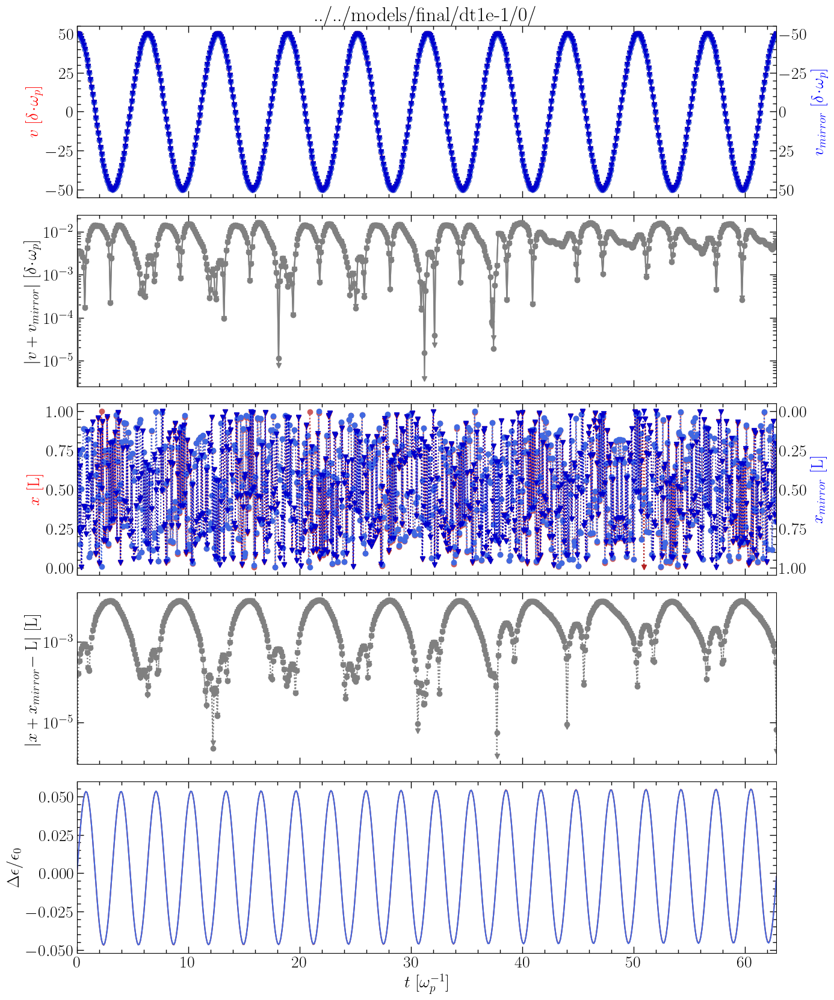

  0%|          | 0/628 [00:00<?, ?it/s]

  0%|          | 0/628 [00:00<?, ?it/s]

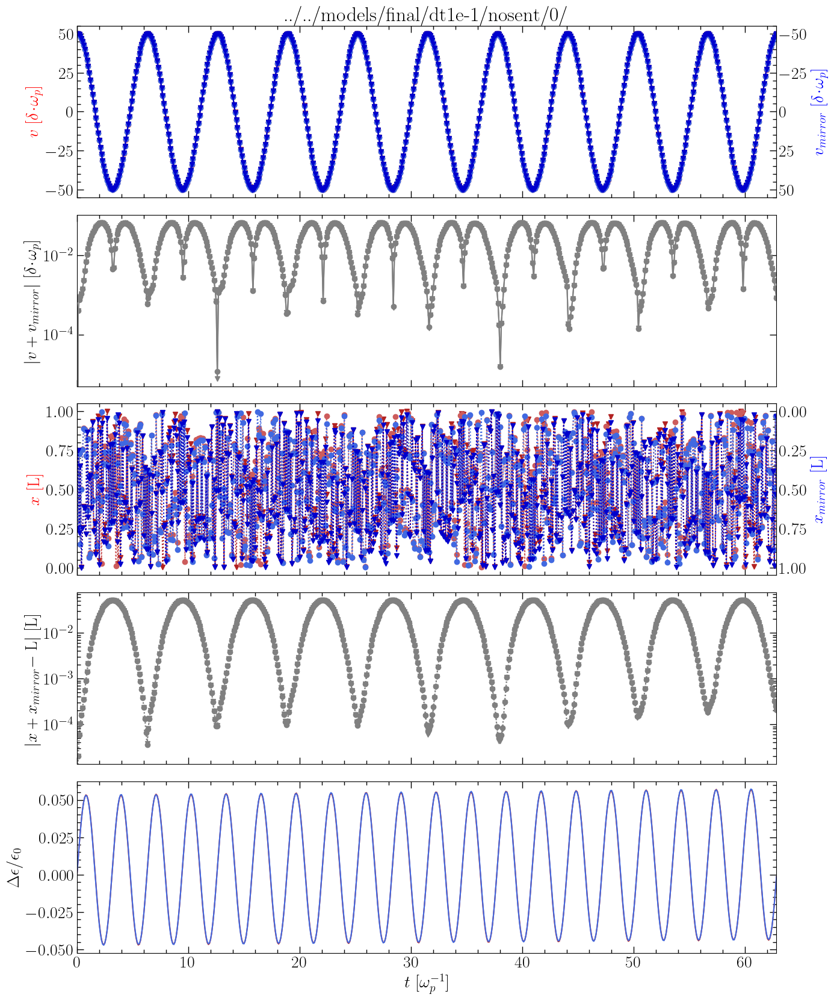

  0%|          | 0/628 [00:00<?, ?it/s]

  0%|          | 0/628 [00:00<?, ?it/s]

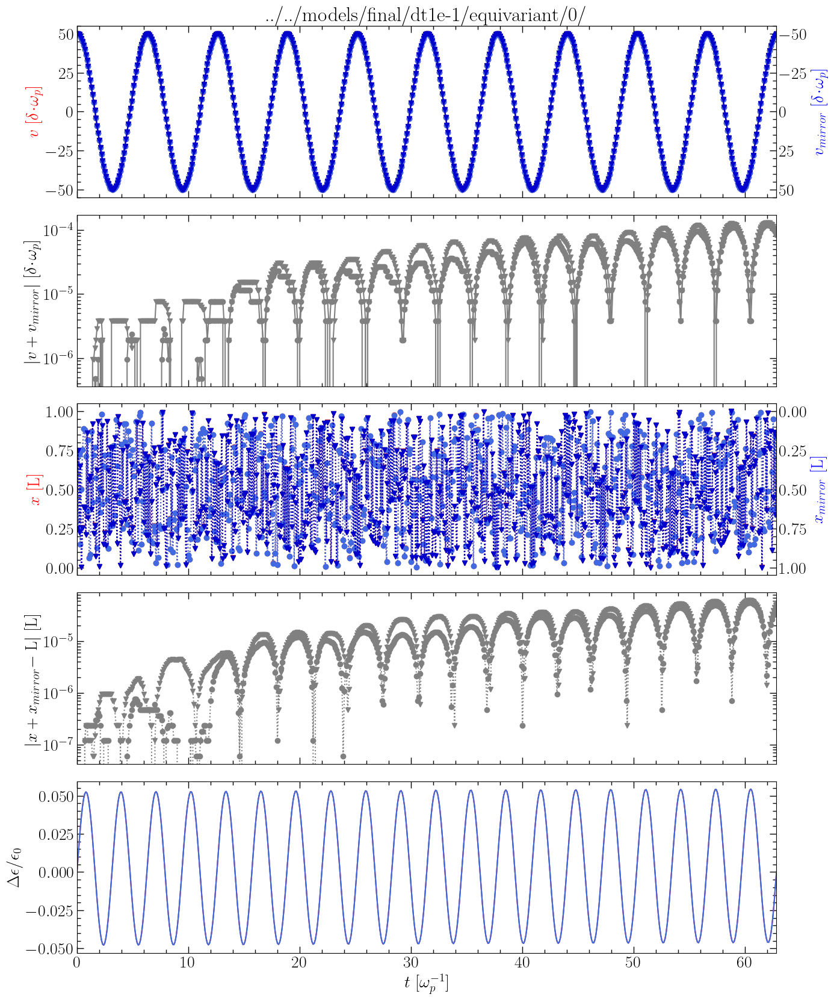

In [25]:
from gns.utils import abs_periodic_d

opt = {
    'n_sheets' : 2, # number of sheets
    'tmax' : 2*np.pi*10,#*50, # total simulation time [1/w_p]
    'boundary' : 'periodic', # boundary type (periodic or reflecting)
    'L': 1
}

dx_eq = get_dx_eq(opt['n_sheets']) 
x_eq = get_x_eq(opt['n_sheets'])

plt.figure(figsize=(15,5))

v_max = 50

for model in ['../../models/final/dt1e-1/0/', 
              '../../models/final/dt1e-1/nosent/0/',
              '../../models/final/dt1e-1/equivariant/0/']:
    
    fig, ax = plt.subplots(5,1,figsize=(15,20), sharex=True, gridspec_kw={'hspace': 0.1})
    ax_t = [a.twinx() if i in [0,2] else None for i, a in enumerate(ax)]
    
    A=[]
    
    gns = SMGNS(model, opt['boundary'], verbose=False)
    
    ######## simulation 1
    x_0 = x_eq.copy() 
    v_0 = np.zeros(opt['n_sheets'])
    
    # equivariance breaks up with multiple particles at x=x_eq and v=0 (because of numerical errors)
    v_0[:] = v_max * dx_eq
    x_0[:] = x_eq[:]
    
    X_1, V_1, X_eq1, E_1 = gns.pred_rollout(x_0,
                                        v_0,
                                        x_eq,
                                        t_max=opt['tmax'],
                                        verbose=True,
                                        n_guards=5 if opt['boundary']=='reflecting' else 0,
                                        np_=np)
     
    ######## simulation 2 (mirror of simulation 1)
    x_0 = np.flip(opt['L'] - x_0)
    v_0 = np.flip(-v_0)
    
    X_2, V_2, X_eq2, E_2 = gns.pred_rollout(x_0,
                                        v_0,
                                        x_eq,
                                        t_max=opt['tmax'],
                                        verbose=True,
                                        n_guards=5 if opt['boundary']=='reflecting' else 0,
                                        np_=np)

    ######## plot
    t = np.linspace(0, opt['tmax'], len(X_1))
    
    for v,c,m in zip(V_1.T, ['firebrick', 'indianred'], ['v', 'o']):
        ax[0].plot(t, v/dx_eq, '-', marker=m, color=c)
        
    
    for v,c,m in zip(V_2.T, ['royalblue', 'mediumblue'], ['o', 'v']):
        ax_t[0].plot(t, v/dx_eq, '-', color=c, marker=m)
    
    for v1,v2,m in zip(V_1.T, jnp.flip(V_2, axis=1).T, ['v', 'o']):
        ax[1].plot(t, np.abs(v1 + v2)/dx_eq, color='grey', marker=m)
    
    for x,c,m in zip(X_1.T, ['firebrick', 'indianred'], ['v', 'o']):
        ax[2].plot(t, x, ':', marker=m, color=c)
        
    for x,c,m in zip(X_2.T, ['royalblue', 'mediumblue'], ['o', 'v']):
        ax_t[2].plot(t, x, ':', color=c, marker=m)
    
    for x1,x2,m in zip(X_1.T, jnp.flip(X_2, axis=1).T, ['v', 'o']):
        ax[3].plot(t, abs_periodic_d(x1, opt['L'] - x2), ':', color='grey', marker=m)
    
    ax[4].plot(t, (E_1-E_1[0])/E_1[0], '-', color='firebrick')
    ax[4].plot(t, (E_2-E_2[0])/E_2[0], '-', color='royalblue')
    
    ax[0].set_title(model)
    
    ax[0].set_ylabel('$v$ [$\delta\!\cdot\!\omega_p$]', color='red')
    ax[1].set_ylabel('$|v + v_{mirror}|$ [$\delta\!\cdot\!\omega_p$]')
    ax[2].set_ylabel('$x$ [L]', color='red')
    ax[3].set_ylabel('$|x + x_{mirror} -$ L$|$ [L]')
    ax[4].set_ylabel('$\Delta\epsilon/\epsilon_0$')
    
    ax_t[0].set_ylabel('$v_{mirror}$ [$\delta\!\cdot\!\omega_p$]', color='blue')
    ax_t[2].set_ylabel('$x_{mirror}$ [L]', color='blue')
    
    ax[-1].set_xlabel('$t$ [$\omega_p^{-1}$]')
    
    plt.setp(ax, xlim=(t[0], t[-1]))
    ax_t[0].set_ylim(ax[0].get_ylim()[::-1])
    ax_t[2].set_ylim(ax[2].get_ylim()[::-1])
    
    ax[1].set_yscale('log')
    ax[3].set_yscale('log')
        
    plt.show()

### Ex. 2 - Counter-Propragating Sheet (Mirrored Velocities)

Now, we perform a single simulation with two sheets with initial mirrored velocities. We expect their velocities and positions to continue being symmetric ($x_1 = x_2 - L$, $v_1 = -v_2$)  for the remainder of the simulation.

Similar to the previous example, we observe that as one increases the initial sheet velocities, the non-equivariant architectures stop ensuring the expected symmetries

#### Low $v$

  0%|          | 0/627 [00:00<?, ?it/s]

<Figure size 1500x500 with 0 Axes>

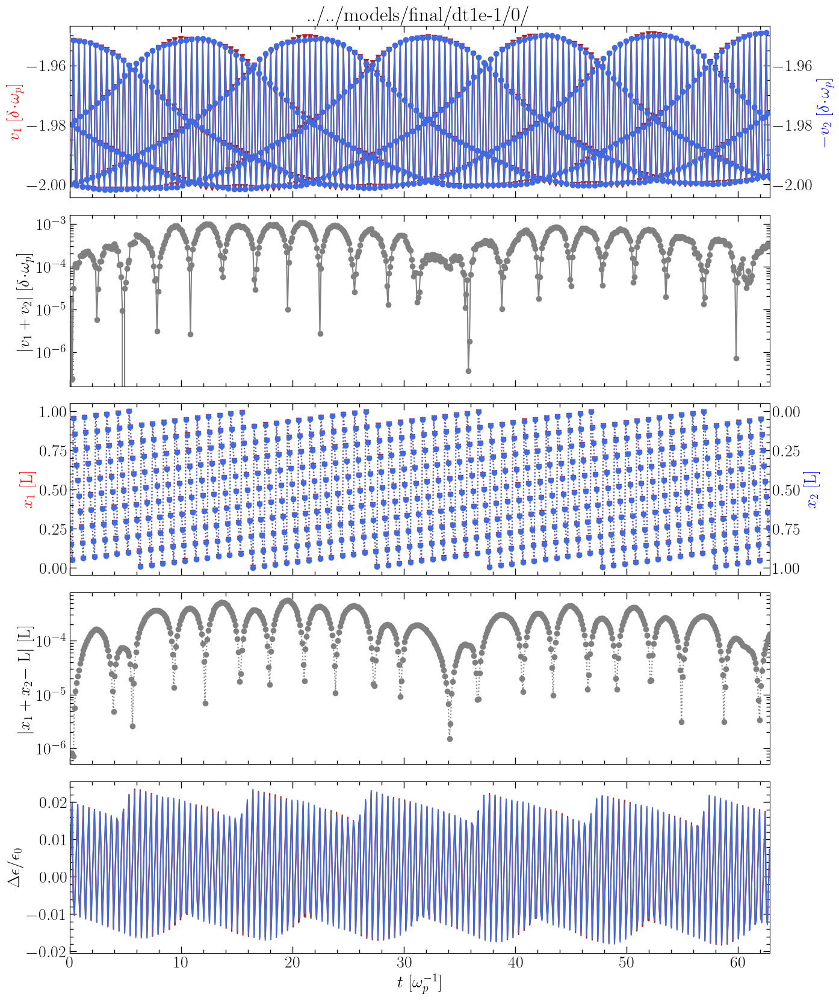

  0%|          | 0/627 [00:00<?, ?it/s]

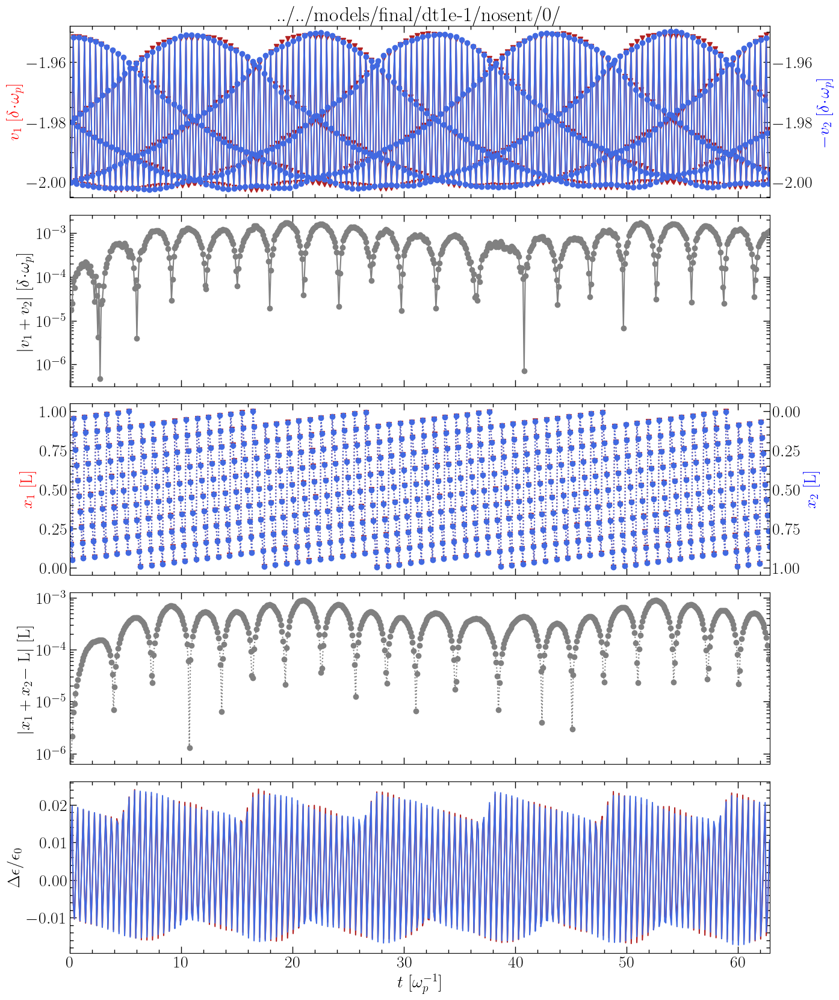

  0%|          | 0/627 [00:00<?, ?it/s]

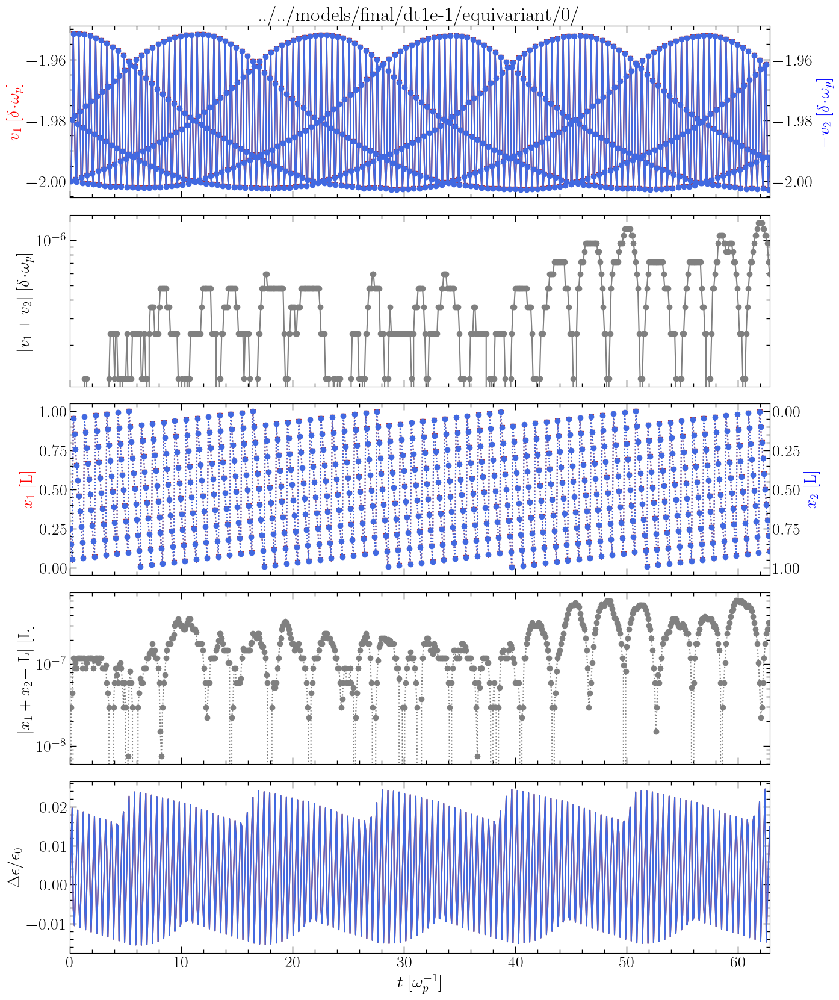

In [26]:
opt = {
    'n_sheets' : 2, # number of sheets
    'tmax' : 2*np.pi*10, # total simulation time [1/w_p]
    'boundary' : 'periodic', # boundary type (periodic or reflecting)
    'L': 1
}

dx_eq = get_dx_eq(opt['n_sheets']) 
x_eq = get_x_eq(opt['n_sheets'])

plt.figure(figsize=(15,5))

v_max = 2

for model in ['../../models/final/dt1e-1/0/', 
              '../../models/final/dt1e-1/nosent/0/',
              '../../models/final/dt1e-1/equivariant/0/']:
    
    fig, ax = plt.subplots(5,1,figsize=(15,20), sharex=True, gridspec_kw={'hspace': 0.1})
    ax_t = [a.twinx() if i in [0,2] else None for i, a in enumerate(ax)]
    
    A=[]
    
    gns = SMGNS(model, opt['boundary'], verbose=False)
    
    ######## simulation 1
    x_0 = x_eq.copy() 
    v_0 = np.zeros(opt['n_sheets'])
    
    # equivariance breaks up with multiple particles at x=x_eq and v=0 (because of numerical errors)
    v_0[:] = v_max * dx_eq
    v_0[:len(v_0)//2] *= -1
    x_0[:] = x_eq[:]
    
    X_1, V_1, X_eq1, E_1 = gns.pred_rollout(x_0,
                                        v_0,
                                        x_eq,
                                        t_max=opt['tmax']-gns.dt_train,
                                        verbose=True,
                                        n_guards=5 if opt['boundary']=='reflecting' else 0,
                                        np_=np)
     
    ######## plot
    t = np.linspace(0, opt['tmax'], len(X_1))
    
    ax[0].plot(t, V_1[:,0]/dx_eq, '-', marker='v', color='firebrick')
    ax_t[0].plot(t, -V_1[:,1]/dx_eq, '-', marker='o', color='royalblue')
        
    ax[1].plot(t, np.abs(V_1[:,0] + V_1[:,1])/dx_eq, color='grey', marker=m)

    ax[2].plot(t, X_1[:,0], ':', marker='v', color='firebrick')
    ax_t[2].plot(t, X_1[:,1], ':', marker='o', color='royalblue')
   
    ax[3].plot(t, abs_periodic_d(X_1[:,0], opt['L'] - X_1[:,1]), ':', color='grey', marker=m)
    
    E = (X_1 - X_eq1)**2 + V_1**2
    ax[4].plot(t, (E[:,0]-E[0,0])/E[0,0], '-', color='firebrick')
    ax[4].plot(t, (E[:,1]-E[0,1])/E[0,1], '-', color='royalblue')
    
    ax[0].set_title(model)
    
    ax[0].set_ylabel('$v_1$ [$\delta\!\cdot\!\omega_p$]', color='red')
    ax[1].set_ylabel('$|v_1 + v_2|$ [$\delta\!\cdot\!\omega_p$]')
    ax[2].set_ylabel('$x_1$ [L]', color='red')
    ax[3].set_ylabel('$|x_1 + x_2 -$ L$|$ [L]')
    ax[4].set_ylabel('$\Delta\epsilon/\epsilon_0$')
    
    ax_t[0].set_ylabel('$-v_2$ [$\delta\!\cdot\!\omega_p$]', color='blue')
    ax_t[2].set_ylabel('$x_2$ [L]', color='blue')
    
    ax[-1].set_xlabel('$t$ [$\omega_p^{-1}$]')
    
    plt.setp(ax, xlim=(t[0], t[-1]))
    ax_t[0].set_ylim(ax[0].get_ylim())
    ax_t[2].set_ylim(ax[2].get_ylim()[::-1])
    
    ax[1].set_yscale('log')
    ax[3].set_yscale('log')
        
    plt.show()

#### High $v$

  0%|          | 0/627 [00:00<?, ?it/s]

<Figure size 1500x500 with 0 Axes>

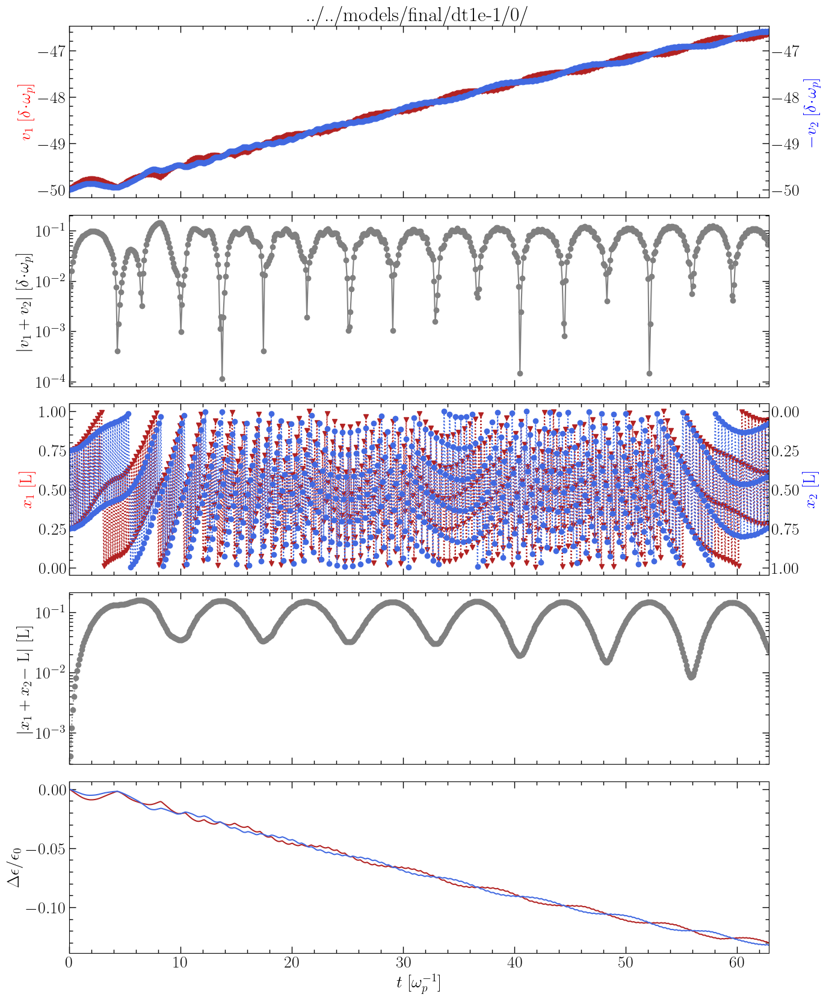

  0%|          | 0/627 [00:00<?, ?it/s]

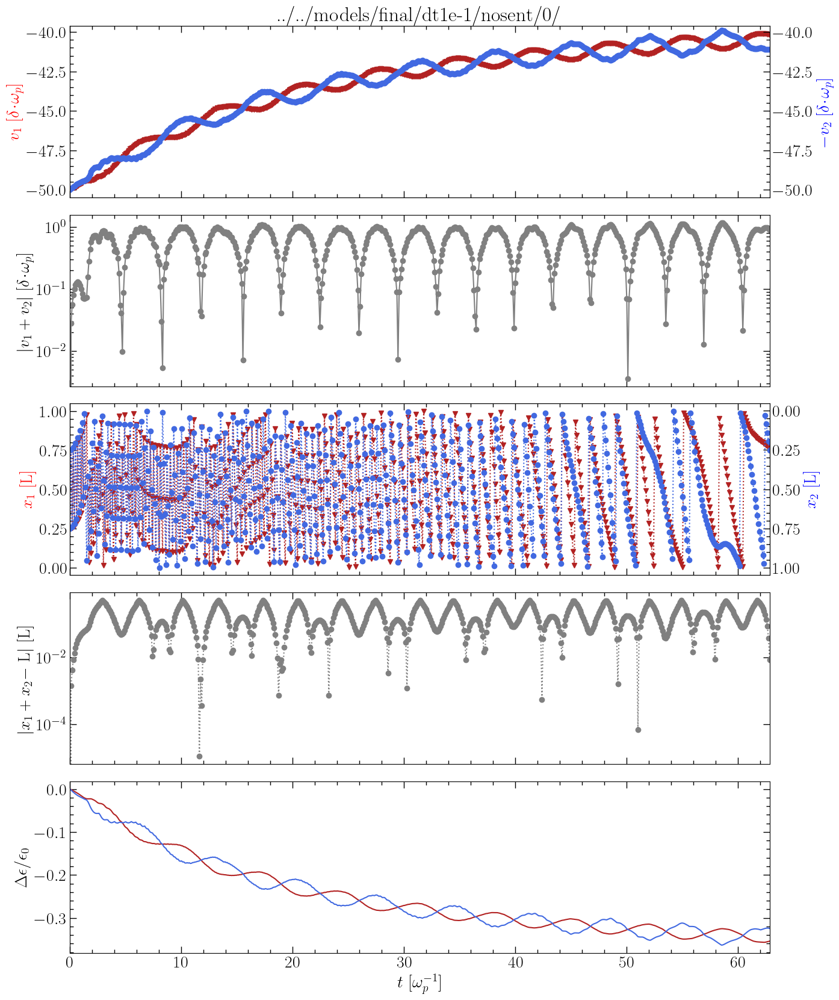

  0%|          | 0/627 [00:00<?, ?it/s]

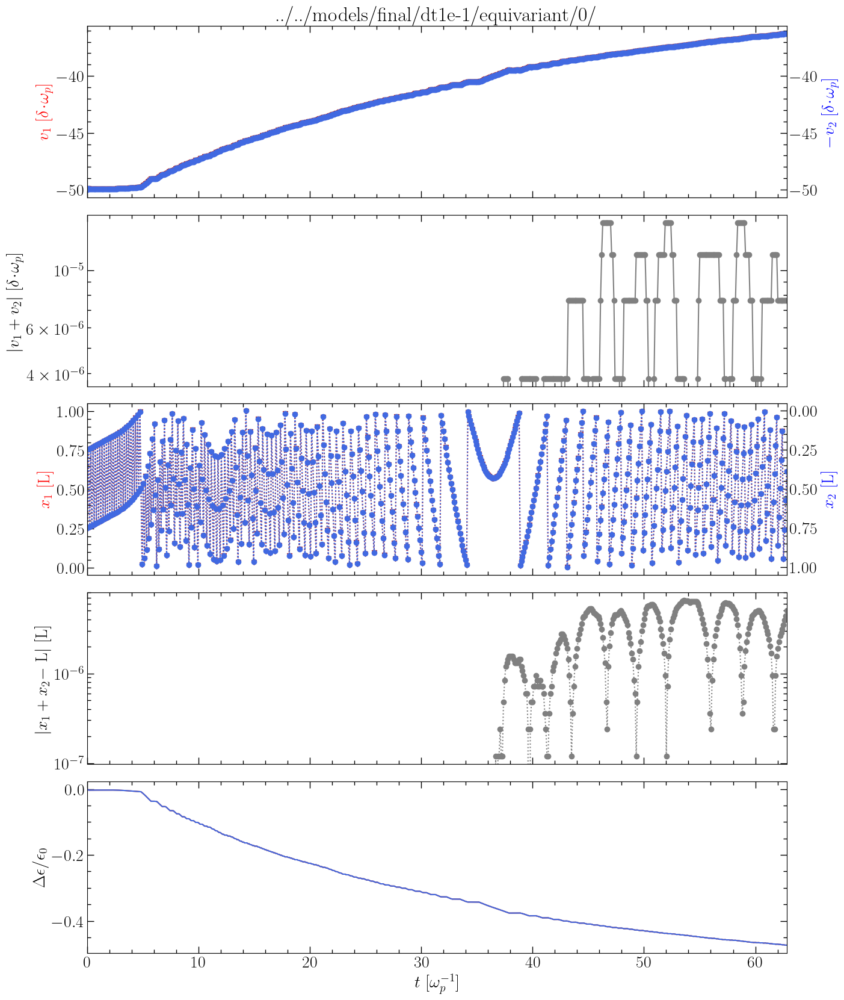

In [27]:
opt = {
    'n_sheets' : 2, # number of sheets
    'tmax' : 2*np.pi*10, # total simulation time [1/w_p]
    'boundary' : 'periodic', # boundary type (periodic or reflecting)
    'L': 1
}

dx_eq = get_dx_eq(opt['n_sheets']) 
x_eq = get_x_eq(opt['n_sheets'])

plt.figure(figsize=(15,5))

v_max = 50

for model in ['../../models/final/dt1e-1/0/', 
              '../../models/final/dt1e-1/nosent/0/',
              '../../models/final/dt1e-1/equivariant/0/']:
    
    fig, ax = plt.subplots(5,1,figsize=(15,20), sharex=True, gridspec_kw={'hspace': 0.1})
    ax_t = [a.twinx() if i in [0,2] else None for i, a in enumerate(ax)]
    
    A=[]
    
    gns = SMGNS(model, opt['boundary'], verbose=False)
    
    ######## simulation 1
    x_0 = x_eq.copy() 
    v_0 = np.zeros(opt['n_sheets'])
    
    # equivariance breaks up with multiple particles at x=x_eq and v=0 (because of numerical errors)
    v_0[:] = v_max * dx_eq
    v_0[:len(v_0)//2] *= -1
    x_0[:] = x_eq[:]
    
    X_1, V_1, X_eq1, E_1 = gns.pred_rollout(x_0,
                                        v_0,
                                        x_eq,
                                        t_max=opt['tmax']-gns.dt_train,
                                        verbose=True,
                                        n_guards=5 if opt['boundary']=='reflecting' else 0,
                                        np_=np)
     
    ######## plot
    t = np.linspace(0, opt['tmax'], len(X_1))
    
    ax[0].plot(t, V_1[:,0]/dx_eq, '-', marker='v', color='firebrick')
    ax_t[0].plot(t, -V_1[:,1]/dx_eq, '-', marker='o', color='royalblue')
        
    ax[1].plot(t, np.abs(V_1[:,0] + V_1[:,1])/dx_eq, color='grey', marker=m)

    ax[2].plot(t, X_1[:,0], ':', marker='v', color='firebrick')
    ax_t[2].plot(t, X_1[:,1], ':', marker='o', color='royalblue')
   
    ax[3].plot(t, abs_periodic_d(X_1[:,0], opt['L'] - X_1[:,1]), ':', color='grey', marker=m)
    
    E = (X_1 - X_eq1)**2 + V_1**2
    ax[4].plot(t, (E[:,0]-E[0,0])/E[0,0], '-', color='firebrick')
    ax[4].plot(t, (E[:,1]-E[0,1])/E[0,1], '-', color='royalblue')
    
    ax[0].set_title(model)
    
    ax[0].set_ylabel('$v_1$ [$\delta\!\cdot\!\omega_p$]', color='red')
    ax[1].set_ylabel('$|v_1 + v_2|$ [$\delta\!\cdot\!\omega_p$]')
    ax[2].set_ylabel('$x_1$ [L]', color='red')
    ax[3].set_ylabel('$|x_1 + x_2 -$ L$|$ [L]')
    ax[4].set_ylabel('$\Delta\epsilon/\epsilon_0$')
    
    ax_t[0].set_ylabel('$-v_2$ [$\delta\!\cdot\!\omega_p$]', color='blue')
    ax_t[2].set_ylabel('$x_2$ [L]', color='blue')
    
    ax[-1].set_xlabel('$t$ [$\omega_p^{-1}$]')
    
    plt.setp(ax, xlim=(t[0], t[-1]))
    ax_t[0].set_ylim(ax[0].get_ylim())
    ax_t[2].set_ylim(ax[2].get_ylim()[::-1])
    
    ax[1].set_yscale('log')
    ax[3].set_yscale('log')
        
    plt.show()